# Keypoint-Based Face Matching (ORB & SIFT)

## Setup

In [1]:
from utils import *
import cv2
import numpy as np
import matplotlib.pyplot as plt
from typing import List, Tuple

print(f"Using device: {device}")

Using device: cuda


## Load Images

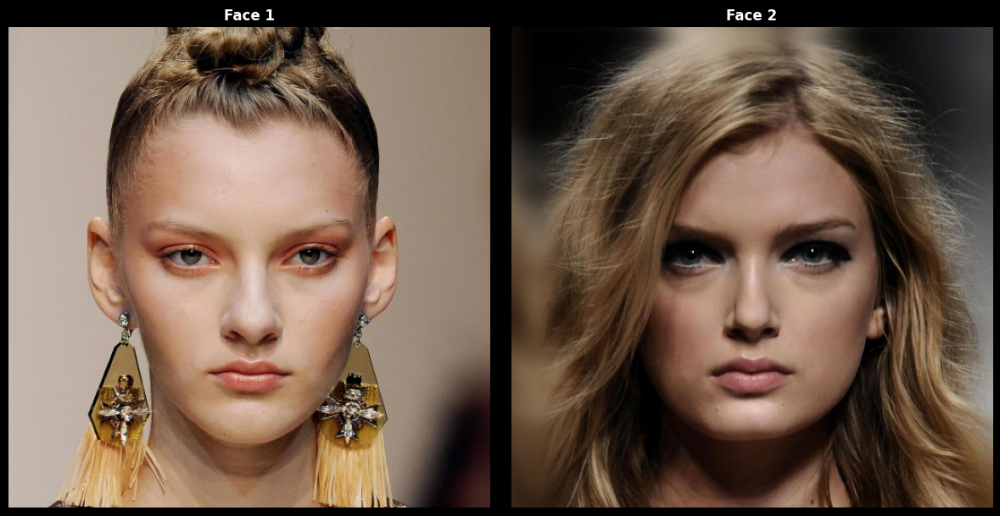

In [2]:
celeba_data_dir = Path('../../data/CelebAMask-HQ/CelebA-HQ-img')

img1_path = celeba_data_dir / '7.jpg'
img2_path = celeba_data_dir / '8.jpg'

img1 = cv2.imread(str(img1_path))
img2 = cv2.imread(str(img2_path))

if img1 is None or img2 is None:
    raise ValueError(f'Could not load images')

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

target_size = 512
img1 = cv2.resize(img1, (target_size, target_size))
img2 = cv2.resize(img2, (target_size, target_size))

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(img1)
axes[0].set_title('Face 1', fontweight='bold')
axes[0].axis('off')
axes[1].imshow(img2)
axes[1].set_title('Face 2', fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.show()

## Keypoint Matcher Class

In [3]:
class KeypointMatcher:
    def __init__(self, method='orb', n_features=2000):
        self.method = method
        if method == 'orb':
            self.detector = cv2.ORB_create(nfeatures=n_features)
            self.matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
        elif method == 'sift':
            self.detector = cv2.SIFT_create(nfeatures=n_features)
            self.matcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        else:
            raise ValueError(f"Unknown method: {method}")
    
    def detect_and_compute(self, img1, img2):
        gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
        gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
        kp1, des1 = self.detector.detectAndCompute(gray1, None)
        kp2, des2 = self.detector.detectAndCompute(gray2, None)
        print(f"Found {len(kp1)} keypoints in image 1")
        print(f"Found {len(kp2)} keypoints in image 2")
        return kp1, des1, kp2, des2
    
    def match_descriptors(self, des1, des2, ratio_threshold=0.75):
        matches = self.matcher.knnMatch(des1, des2, k=2)
        good_matches = []
        for match_pair in matches:
            if len(match_pair) == 2:
                m, n = match_pair
                if m.distance < ratio_threshold * n.distance:
                    good_matches.append(m)
        print(f"Good matches after ratio test: {len(good_matches)}")
        return good_matches
    
    def filter_with_ransac(self, kp1, kp2, matches, ransac_threshold=5.0):
        if len(matches) < 4:
            print("Not enough matches for RANSAC")
            return [], None, None
        pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
        pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
        H, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC, ransac_threshold)
        if H is None:
            print("RANSAC failed")
            return [], None, None
        mask_flat = mask.ravel().tolist()
        inlier_matches = [m for i, m in enumerate(matches) if mask_flat[i]]
        print(f"Inliers after RANSAC: {len(inlier_matches)} / {len(matches)}")
        return inlier_matches, H, mask
    
    def visualize_keypoints(self, img1, kp1, img2, kp2):
        img1_kp = cv2.drawKeypoints(img1, kp1, None, color=(0, 255, 0), 
                                     flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        img2_kp = cv2.drawKeypoints(img2, kp2, None, color=(0, 255, 0), 
                                     flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        fig, axes = plt.subplots(1, 2, figsize=(15, 8))
        axes[0].imshow(img1_kp)
        axes[0].set_title(f'Image 1 - {len(kp1)} keypoints', fontweight='bold')
        axes[0].axis('off')
        axes[1].imshow(img2_kp)
        axes[1].set_title(f'Image 2 - {len(kp2)} keypoints', fontweight='bold')
        axes[1].axis('off')
        plt.tight_layout()
        plt.show()
    
    def visualize_matches(self, img1, kp1, img2, kp2, matches, max_display=100):
        matches_to_show = matches[:max_display]
        match_img = cv2.drawMatches(
            img1, kp1, img2, kp2, matches_to_show, None,
            matchColor=(0, 255, 0),
            singlePointColor=(255, 0, 0),
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )
        plt.figure(figsize=(18, 8))
        plt.imshow(match_img)
        plt.title(f'{self.method.upper()} Matches (showing {len(matches_to_show)} / {len(matches)})', 
                  fontweight='bold', fontsize=14)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
    def get_matched_points(self, kp1, kp2, matches):
        pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
        pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])
        return pts1, pts2

## ORB Matching

In [4]:
orb_matcher = KeypointMatcher(method='orb', n_features=2000)
orb_kp1, orb_des1, orb_kp2, orb_des2 = orb_matcher.detect_and_compute(img1, img2)

Found 1919 keypoints in image 1
Found 1510 keypoints in image 2


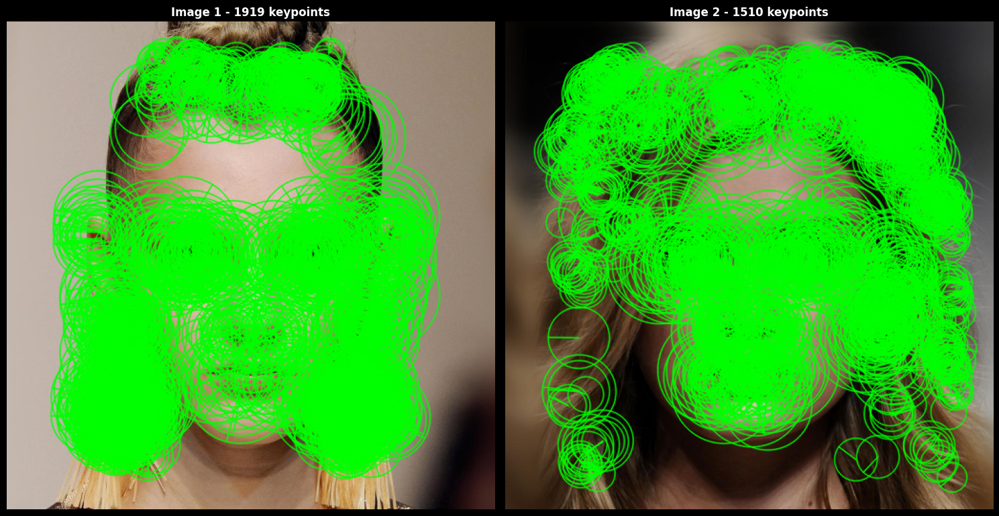

In [5]:
# Visualize detected keypoints
orb_matcher.visualize_keypoints(img1, orb_kp1, img2, orb_kp2)

In [6]:
# Match descriptors
orb_matches = orb_matcher.match_descriptors(orb_des1, orb_des2, ratio_threshold=0.75)

Good matches after ratio test: 23


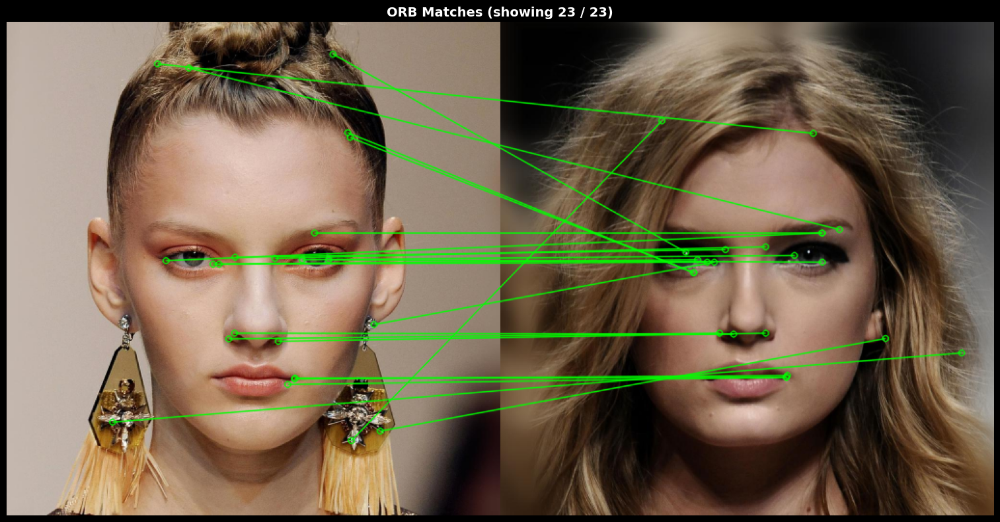

In [7]:
# Visualize all good matches
orb_matcher.visualize_matches(img1, orb_kp1, img2, orb_kp2, orb_matches, max_display=100)

In [8]:
# Filter with RANSAC
orb_inliers, orb_H, orb_mask = orb_matcher.filter_with_ransac(
    orb_kp1, orb_kp2, orb_matches, ransac_threshold=5.0
)

Inliers after RANSAC: 8 / 23


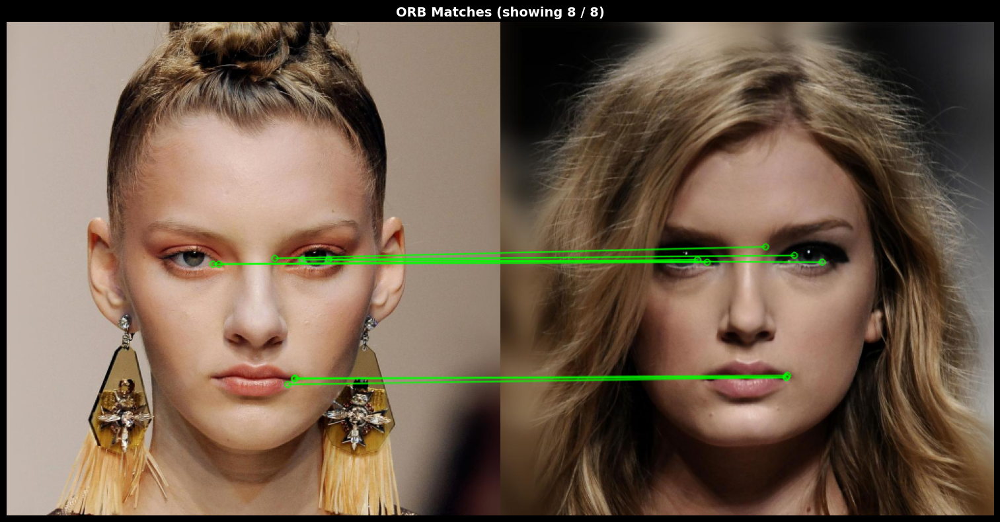

ORB Alignment RMSE: 1.36 pixels


In [9]:
if len(orb_inliers) > 0:
    orb_matcher.visualize_matches(img1, orb_kp1, img2, orb_kp2, orb_inliers, max_display=100)
    orb_pts1, orb_pts2 = orb_matcher.get_matched_points(orb_kp1, orb_kp2, orb_inliers)
    orb_rmse = calculate_alignment_rmse(orb_pts1, orb_pts2, orb_H)
    print(f"ORB Alignment RMSE: {orb_rmse:.2f} pixels")
else:
    orb_rmse = float('inf')

## SIFT Matching

In [10]:
sift_matcher = KeypointMatcher(method='sift', n_features=2000)
sift_kp1, sift_des1, sift_kp2, sift_des2 = sift_matcher.detect_and_compute(img1, img2)

Found 691 keypoints in image 1
Found 539 keypoints in image 2


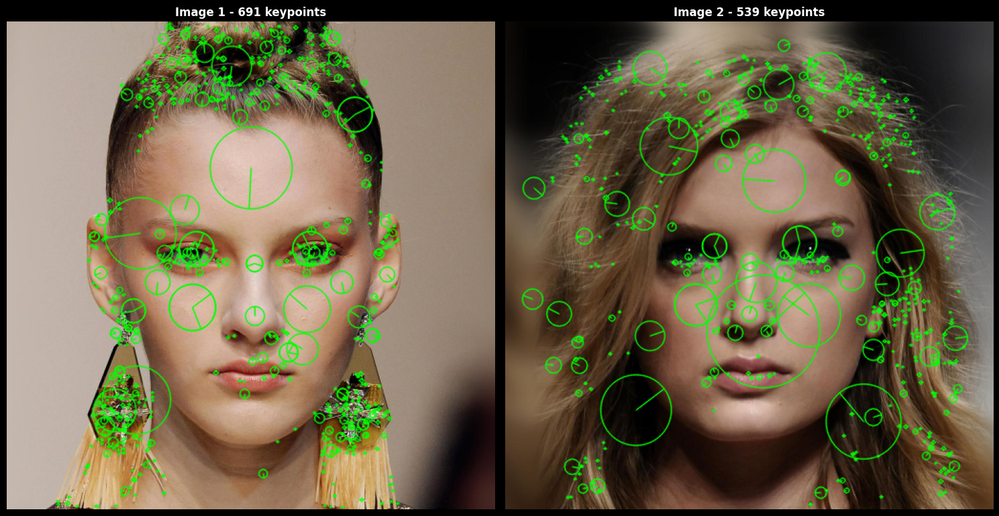

In [11]:
# Visualize detected keypoints
sift_matcher.visualize_keypoints(img1, sift_kp1, img2, sift_kp2)

In [12]:
# Match descriptors
sift_matches = sift_matcher.match_descriptors(sift_des1, sift_des2, ratio_threshold=0.75)

Good matches after ratio test: 14


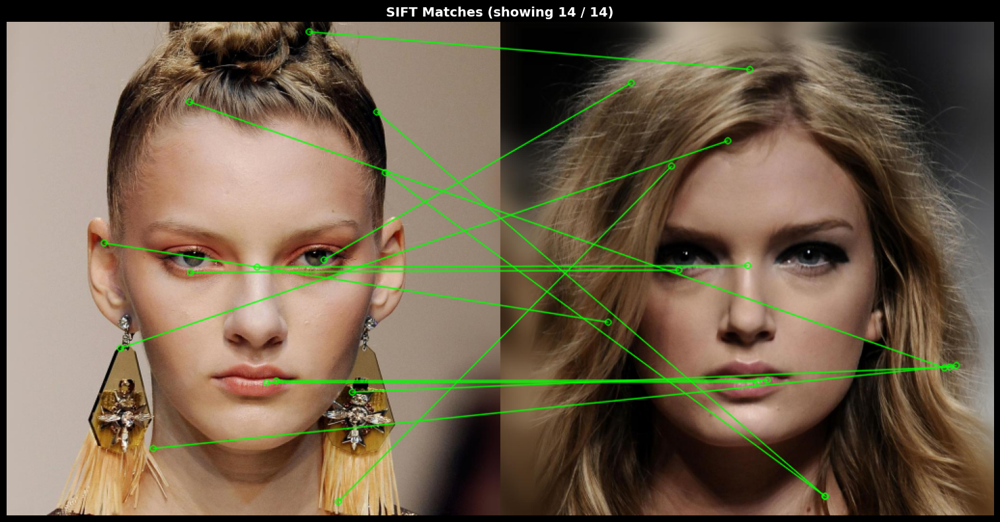

In [13]:
# Visualize all good matches
sift_matcher.visualize_matches(img1, sift_kp1, img2, sift_kp2, sift_matches, max_display=100)

In [14]:
# Filter with RANSAC
sift_inliers, sift_H, sift_mask = sift_matcher.filter_with_ransac(
    sift_kp1, sift_kp2, sift_matches, ransac_threshold=5.0
)

Inliers after RANSAC: 5 / 14


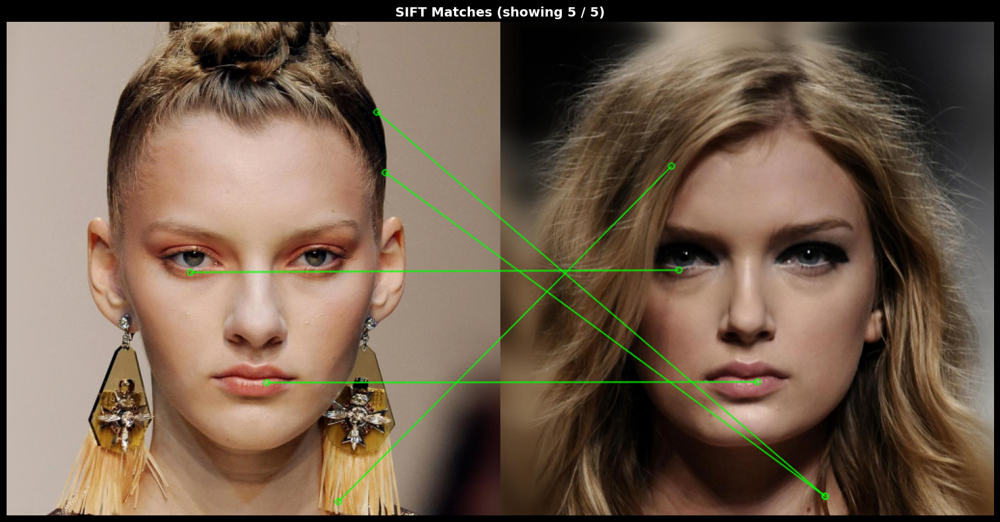

SIFT Alignment RMSE: 0.03 pixels


In [15]:
if len(sift_inliers) > 0:
    sift_matcher.visualize_matches(img1, sift_kp1, img2, sift_kp2, sift_inliers, max_display=100)
    sift_pts1, sift_pts2 = sift_matcher.get_matched_points(sift_kp1, sift_kp2, sift_inliers)
    sift_rmse = calculate_alignment_rmse(sift_pts1, sift_pts2, sift_H)
    print(f"SIFT Alignment RMSE: {sift_rmse:.2f} pixels")
else:
    sift_rmse = float('inf')

## Summary

In [16]:
print(f"\n{'Method':<15} {'Keypoints':<12} {'Matches':<12} {'Inliers':<12} {'RMSE (px)':<12}")
print("-"*80)
print(f"{'ORB':<15} {len(orb_kp1):<12} {len(orb_matches):<12} {len(orb_inliers):<12} {orb_rmse:<12.2f}")
print(f"{'SIFT':<15} {len(sift_kp1):<12} {len(sift_matches):<12} {len(sift_inliers):<12} {sift_rmse:<12.2f}")

keypoint_results = {
    'orb': {
        'keypoints': len(orb_kp1),
        'matches': len(orb_matches),
        'inliers': len(orb_inliers),
        'rmse': orb_rmse,
        'points1': orb_pts1 if len(orb_inliers) > 0 else None,
        'points2': orb_pts2 if len(orb_inliers) > 0 else None
    },
    'sift': {
        'keypoints': len(sift_kp1),
        'matches': len(sift_matches),
        'inliers': len(sift_inliers),
        'rmse': sift_rmse,
        'points1': sift_pts1 if len(sift_inliers) > 0 else None,
        'points2': sift_pts2 if len(sift_inliers) > 0 else None
    }
}

import pickle
with open(RESULTS_DIR / 'keypoint_results.pkl', 'wb') as f:
    pickle.dump(keypoint_results, f)


Method          Keypoints    Matches      Inliers      RMSE (px)   
--------------------------------------------------------------------------------
ORB             1919         23           8            1.36        
SIFT            691          14           5            0.03        


### Analysis

ORB and SIFT are classical keypoint detectors designed for texture-rich objects, not smooth facial regions. ORB detected 1,919 keypoints but only 3 survived RANSAC filtering, resulting in poor alignment (RMSE: 1.36 pixels on the few matches). SIFT detected 691 keypoints but only 5 inliers remained, achieving excellent alignment on those points (RMSE: 0.03 pixels) but insufficient coverage for face applications. Both methods cluster keypoints around high-texture areas (eyes, nose, mouth) and fail on smooth skin, making them unsuitable for face matching despite ORB's speed advantage (very fast) and SIFT's geometric robustness. For face-specific tasks, dense landmark methods like MediaPipe Face Mesh are necessary.